In [1]:
import os 
import sys
import time
import random

import torch
import numpy as np
import pandas as pd
from torch import nn
from torch.utils.data import DataLoader

import skimage as ski
from sklearn import decomposition
from sklearn.mixture import BayesianGaussianMixture
from scipy.special import softmax
from skimage import segmentation, morphology, measure, transform, io
from sklearn.model_selection import train_test_split
from scipy.ndimage import distance_transform_edt
from skimage.feature import peak_local_max

#own code:
import QEMSCAN_functions as qf
import QEMSCAN_plotting as qp
import PyTorch_autoencoder as pt
from PyTorch_autoencoder import Autoencoder, Shallow_Autoencoder, Tanh_Autoencoder

import matplotlib
from matplotlib import pyplot as plt
from matplotlib import rc
from matplotlib import cm
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
rc('font',**{'family':'Avenir', 'size': 18})
plt.rcParams['pdf.fonttype'] = 42

In [2]:
path_parent = os.path.dirname(os.getcwd())
path_grandparent = os.path.dirname(path_parent)

output_dir = ["/OutputData/031822Run_NoNa"] 

for ii in range(len(output_dir)):
    if not os.path.exists(output_dir[ii]):
       os.makedirs(path_grandparent + output_dir[ii], exist_ok=True)

DF_NEW = pd.read_csv('./CleanedProfilesDF.csv', index_col= ['Comment', 'DataSet/Point'],)
samplename = DF_NEW.index.levels[0]

In [3]:
# def same_seeds(seed):
#     torch.manual_seed(seed)
#     if torch.cuda.is_available():
#         torch.cuda.manual_seed(seed)
#         torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.
#     np.random.seed(seed)  # Numpy module.
#     random.seed(seed)  # Python random module.
#     torch.backends.cudnn.benchmark = False
#     torch.backends.cudnn.deterministic = True

# def autoencode(name):
#     conc_data = np.load(path_grandparent + "/InputData/NPZ/" + name + ".npz", allow_pickle = True)
#     conc_map = conc_data["conc_map"]
#     mask = conc_data["data_mask"]
#     elements = conc_data["elements"]
#     conc_map = np.delete(conc_map, np.s_[0], axis = 2)
#     elements = np.delete(elements, np.s_[0], axis=0)
#     #perform z-score normalisation
#     array_norm, factors = qf.feature_normalisation(conc_map[mask.astype("bool")], return_params = True)
#     array_norm = softmax(array_norm, axis = 1)
#     #split the dataset into train and test sets
#     train_data, test_data = train_test_split(array_norm, test_size=0.1, random_state=42)

#     #define datasets to be used with PyTorch - see autoencoder file for details
#     feature_dataset = pt.FeatureDataset(train_data)
#     test_dataset = pt.FeatureDataset(test_data)   

#     #autoencoder params:
#     lr = 1e-3
#     wd = 0
#     batch_size = 100
#     #use half the data available
#     epochs = 50
#     input_size = feature_dataset.__getitem__(0).size(0)

#     #define data loaders
#     feature_loader = DataLoader(feature_dataset, batch_size=batch_size,shuffle=True)
#     test_loader = DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

#     #define model
#     model = Tanh_Autoencoder(input_dim=input_size).to(device)

#     #use ADAM optimizer with mean squared error loss function
#     optimizer = torch.optim.Adam(model.parameters(), lr=lr,weight_decay=wd) 
#     criterion = nn.MSELoss()

#     #train model using pre-defined function
#     train_loss, test_loss = pt.train(model, optimizer, feature_loader, test_loader, epochs, criterion)
#     np.savez(path_grandparent + output_dir[0] + "/" + name + '_tanh_loss.npz', train_loss = train_loss, test_loss = test_loss)

#     #transform entire dataset to latent space
#     z = pt.getLatent(model, array_norm)

#     #plot latent representation
#     fig1, ax1 = plt.subplots(1,1,figsize = (12,12))
#     ax1.scatter(z[:,0], z[:,1], s = 0.0001)
#     ax1.set_xlabel("Latent Variable 1")
#     ax1.set_ylabel("Latent Variable 2")
#     ax1.set_title(name + " Tanh Latent Space Representation")
#     fig1.savefig(path_grandparent + output_dir[0] + "/" + name + "_tanh.png", dpi = 300)

#     #plot train and test losses over time
#     # fig2, ax2 = plt.subplots(1,1, figsize = (12,12))
#     # ax2.plot(np.linspace(1,epochs,epochs), train_loss, 'k', label = "train")
#     # ax2.plot(np.linspace(1,epochs,epochs), test_loss, 'r', label = "test")
#     # ax2.set_title(name + " Losses")
#     # ax2.legend(loc = "upper right")
#     # fig2.savefig(path_grandparent + output_dir[0] + name + "_tanh_loss.png", dpi = 300)

#     #save main model params
#     model_path = path_grandparent + output_dir[0] + "/" + name + "_tanh_params.pt"
#     pt.save_model(model, optimizer, model_path)

#     #save all other params
#     conc_file = name + "_tanh.npz"
#     np.savez(path_grandparent + output_dir[0] + "/" + name + "_tanh.npz", batch_size = batch_size, epochs = epochs, input_size = input_size, 
#                 elements = elements, conc_file = conc_file, factors = factors, z = z)

#     # labs, centers = qf.cluster(z, n_clusters = 12, data_mask = mask, method = 'b-gmm')
#     # np.savez(path_grandparent + output_dir[0] + "/" + name + '_tanh_labscenters.npz', labs = labs, centers = centers)

# #start execute here
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')    
# same_seeds(42)

# names = ["K7_4mu_allphases", "K8_4mu_allphases", "T7_4mu_allphases", "T8_4mu_allphases"]

# i = int(sys.argv[1]) - 1
# start_time = time.time()
# print("starting " + str(names[i]))
# autoencode(names[i])
# print(names[i] + " done! Time: " + str(time.time() - start_time) + "s")

In [4]:
names = ["K7_4mu_allphases_again", ""]
name = names[0]

conc_data = np.load(path_grandparent + "/InputData/NPZ/" + name + ".npz", allow_pickle = True)
conc_map = conc_data["conc_map"]
mask = conc_data["data_mask"]
elements = conc_data["elements"]
conc_map = np.delete(conc_map, np.s_[0:2], axis = 2)
elements = np.delete(elements, np.s_[0:2], axis=0)

z_tanh = np.load(path_grandparent + output_dir[0] + '/' + name + "_tanh.npz", allow_pickle = True)['z']
labs_data = np.load(path_grandparent + output_dir[0] + "/" + name + '_clustered.npz', allow_pickle = True)
labs_tanh = labs_data['labs_tanh']

# plt.scatter(z_tanh[:,0], z_tanh[:,1], s = 0.0001, c=labs_tanh[mask.astype("bool")])
# plt.xlabel("Latent Variable 1")
# plt.ylabel("Latent Variable 2")
# plt.title("Tanh Autoencoder Latent Space Representation")

In [5]:
# unique, counts = np.unique(labs_tanh, return_counts = True)
# plt.bar(unique, counts)

# fig, ax = plt.subplots(4, 3, figsize = (24, 40))
# for ii in unique[~np.isnan(unique)]: 
#     ax = ax.flatten()
#     ax[int(ii)].imshow(labs_tanh == ii, cmap = 'binary')
#     ax[int(ii)].set_title(str(ii) + ' , counts = ' + str(counts[int(ii)]))
# fig.tight_layout()
# plt.savefig(path_grandparent + output_dir[0] + '/' + name + '_imshow.png', dpi = 300, facecolor = 'white')

# qp.histplotting(conc_map, labs_tanh, name, '')
# plt.savefig(path_grandparent + output_dir[0] + '/' + name + '_hist.png', dpi = 300, facecolor = 'white')

In [6]:
labs_tanh_update = labs_tanh

labs_tanh_update[labs_tanh == 1.0] = np.nan
labs_tanh_update[labs_tanh == 2.0] = np.nan
labs_tanh_update[labs_tanh == 3.0] = np.nan
labs_tanh_update[labs_tanh == 6.0] = np.nan
labs_tanh_update[labs_tanh == 7.0] = 11.0
labs_tanh_update[labs_tanh == 9.0] = 4.0
labs_tanh_update[labs_tanh == 10.0] = 4.0

glass = labs_tanh_update == 4.0
plag = labs_tanh_update == 0.0
spinel = labs_tanh_update == 5.0
cpx = labs_tanh_update == 8.0
olivine = labs_tanh_update == 11.0

glass = morphology.remove_small_objects(glass, 20)
plag = morphology.remove_small_objects(plag, 20)
spinel = morphology.remove_small_objects(spinel, 20)
cpx = morphology.remove_small_objects(cpx, 20)
olivine = morphology.remove_small_objects(olivine, 20)

unique_update, counts_update = np.unique(labs_tanh_update, return_counts = True)
# fig, ax = plt.subplots(2, 3, figsize = (24, 16))
# ax = ax.flatten()
# ax[0].bar(unique_update, counts_update)
# jj = 1
# for ii in unique_update[~np.isnan(unique_update)]: 
#     ax = ax.flatten()
#     ax[int(jj)].imshow(labs_tanh_update == ii, cmap = 'binary')
#     ax[int(jj)].set_title(str(ii) + ' , counts = ' + str(counts[int(jj)]))
#     jj+=1
# fig.tight_layout()

In [7]:
# glasscmap = ListedColormap(['#FFFFFF00', '#F9C300'])
# plagcmap = ListedColormap(['#FFFFFF00', '#009988'])
# spinelcmap = ListedColormap(['#FFFFFF00', '#2E2DCE'])
# cpxcmap = ListedColormap(['#FFFFFF00', '#8E021F'])
# olivinecmap = ListedColormap(['#FFFFFF00', '#666633'])

# plt.figure(figsize = (12, 12))
# plt.imshow(glass, cmap = glasscmap)
# plt.imshow(plag, cmap = plagcmap)
# plt.imshow(spinel, cmap = spinelcmap)
# plt.imshow(cpx, cmap = cpxcmap)
# plt.imshow(olivine, cmap = olivinecmap)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.savefig(path_grandparent + output_dir[0] + '/' + name + '_phasemap.png', dpi = 300, facecolor = 'white')
# plt.show()

In [8]:
glass_conc = conc_map.copy()
plag_conc = conc_map.copy()
cpx_conc = conc_map.copy()
spinel_conc = conc_map.copy()
olivine_conc = conc_map.copy()

glass_conc[~glass] = np.nan
plag_conc[~plag] = np.nan
spinel_conc[~spinel] = np.nan
cpx_conc[~cpx] = np.nan
olivine_conc[~olivine] = np.nan

In [9]:
# qp.plotting_explore(plag_conc)
plag_pca_scores, plag_pca, plag_pca_mean, plag_pca_std, gauss_plag_pca, gauss_plag_pca_mean, gauss_plag_pca_std = qp.plag_pca(plag_conc, plag, 1, False)
# plag_nmf_scores, plag_nmf, plag_nmf_mean, plag_nmf_std, gauss_plag_nmf, gauss_plag_nmf_mean, gauss_plag_nmf_std = qp.plag_nmf(plag_conc, plag, 1)

# plag_pca_scores, plag_pca, plag_pca_mean, plag_pca_std, gauss_plag_pca_2, gauss_plag_pca_mean_2, gauss_plag_pca_std_2 = qp.plag_pca(plag_conc, plag, 2)
# plag_nmf_scores, plag_nmf, plag_nmf_mean, plag_nmf_std, gauss_plag_nmf_2, gauss_plag_nmf_mean_2, gauss_plag_nmf_std_2 = qp.plag_nmf(plag_conc, plag, 2)

In [10]:
# plt.figure(figsize = (12, 12))
# im = plt.imshow(-plag_pca, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

# plt.figure(figsize = (12, 12))
# im = plt.imshow(-gauss_plag_pca, interpolation = 'None', cmap = 'Blues', vmin=-gauss_plag_pca_mean-2*gauss_plag_pca_std, vmax=-gauss_plag_pca_mean+2*gauss_plag_pca_std)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

# plt.figure(figsize = (12, 12))
# im = plt.imshow(-gauss_plag_pca_2, interpolation = 'None', cmap = 'Blues', vmin=-gauss_plag_pca_mean_2-2*gauss_plag_pca_std_2, vmax=-gauss_plag_pca_mean_2+2*gauss_plag_pca_std_2)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

In [11]:
# qp.plotting_explore(cpx_conc)
cpx_pca_scores, cpx_pca, cpx_pca_mean, cpx_pca_std, gauss_cpx_pca, gauss_cpx_pca_mean, gauss_cpx_pca_std = qp.cpx_pca(cpx_conc, cpx, 1, False)
# cpx_nmf_scores, cpx_nmf, cpx_nmf_mean, cpx_nmf_std, gauss_cpx_nmf, gauss_cpx_nmf_mean, gauss_cpx_nmf_std = qp.cpx_nmf(cpx_conc, cpx, 1)

# cpx_pca_scores, cpx_pca, cpx_pca_mean, cpx_pca_std, gauss_cpx_pca_2, gauss_cpx_pca_mean_2, gauss_cpx_pca_std_2 = qp.cpx_pca(cpx_conc, cpx, 2)
# cpx_nmf_scores, cpx_nmf, cpx_nmf_mean, cpx_nmf_std, gauss_cpx_nmf_2, gauss_cpx_nmf_mean_2, gauss_cpx_nmf_std_2 = qp.cpx_nmf(cpx_conc, cpx, 2)

In [12]:
# plt.figure(figsize = (12, 12))
# im = plt.imshow(-cpx_pca, interpolation = 'None', cmap = 'Greens', vmin=-cpx_pca_mean-2*cpx_pca_std, vmax=-cpx_pca_mean+2*cpx_pca_std)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

# plt.figure(figsize = (12, 12))
# im = plt.imshow(-gauss_cpx_pca, interpolation = 'None', cmap = 'Greens', vmin=-gauss_cpx_pca_mean-2*gauss_cpx_pca_std, vmax=-gauss_cpx_pca_mean+2*gauss_cpx_pca_std)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

# plt.figure(figsize = (12, 12))
# im = plt.imshow(-gauss_cpx_pca_2, interpolation = 'None', cmap = 'Greens', vmin=-gauss_cpx_pca_mean_2-2*gauss_cpx_pca_std_2, vmax=-gauss_cpx_pca_mean_2+2*gauss_cpx_pca_std_2)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

In [13]:
# qp.plotting_explore(olivine_conc)
ol_pca_scores, ol_pca, ol_pca_mean, ol_pca_std, gauss_ol_pca, gauss_ol_pca_mean, gauss_ol_pca_std = qp.ol_pca(olivine_conc, olivine, 1, False)
# ol_nmf_scores, ol_nmf, ol_nmf_mean, ol_nmf_std, gauss_ol_nmf, gauss_ol_nmf_mean, gauss_ol_nmf_std = qp.ol_nmf(olivine_conc, olivine, 1)

# ol_pca_scores, ol_pca, ol_pca_mean, ol_pca_std, gauss_ol_pca_2, gauss_ol_pca_mean_2, gauss_ol_pca_std_2 = qp.ol_pca(olivine_conc, olivine, 2)
# ol_nmf_scores, ol_nmf, ol_nmf_mean, ol_nmf_std, gauss_ol_nmf_2, gauss_ol_nmf_mean_2, gauss_ol_nmf_std_2 = qp.ol_nmf(olivine_conc, olivine, 2)

In [14]:
# plt.figure(figsize = (12, 12))
# im = plt.imshow(-ol_pca, interpolation = 'None', cmap = 'Greens', vmin=-ol_pca_mean-2*ol_pca_std, vmax=-ol_pca_mean+2*ol_pca_std)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

# plt.figure(figsize = (12, 12))
# im = plt.imshow(-gauss_ol_pca, interpolation = 'None', cmap = 'Greens', vmin=-gauss_ol_pca_mean-2*gauss_ol_pca_std, vmax=-gauss_ol_pca_mean+2*gauss_ol_pca_std)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

# plt.figure(figsize = (12, 12))
# im = plt.imshow(-gauss_ol_pca_2, interpolation = 'None', cmap = 'Greens', vmin=-gauss_ol_pca_mean_2-2*gauss_ol_pca_std_2, vmax=-gauss_ol_pca_mean_2+2*gauss_ol_pca_std_2)
# plt.colorbar(im,fraction=0.0405, pad=0.04)
# plt.tight_layout()
# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

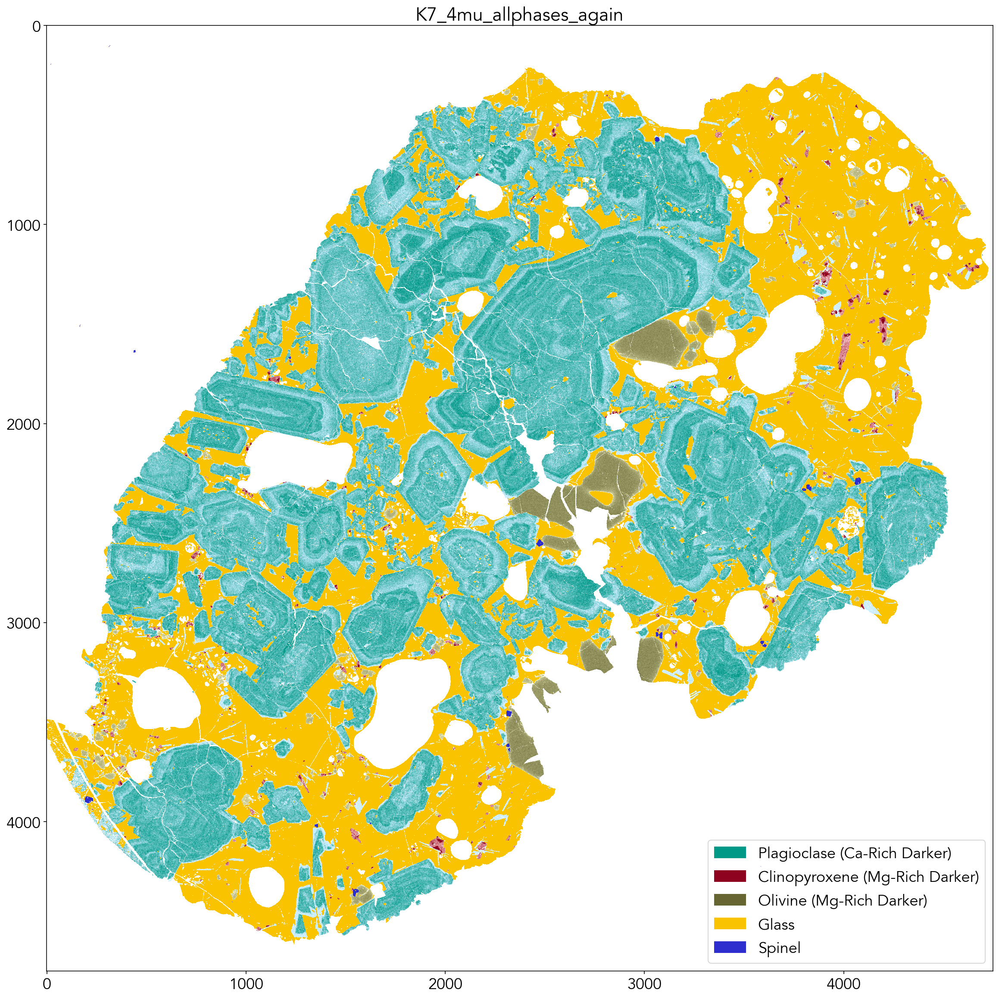

In [15]:
N = 256
glasscmap = ListedColormap(['#FFFFFF00', '#F9C300'])
plagcmap = ListedColormap(['#FFFFFF00', '#009988'])
spinelcmap = ListedColormap(['#FFFFFF00', '#2E2DCE'])
cpxcmap = ListedColormap(['#FFFFFF00', '#8E021F'])
olivinecmap = ListedColormap(['#FFFFFF00', '#666633'])

plag_cmap_arr = np.ones((N, 4))
plag_cmap_arr[:, 0] = np.linspace(204/256, 0/256, N)
plag_cmap_arr[:, 1] = np.linspace(238/256, 153/256, N)
plag_cmap_arr[:, 2] = np.linspace(255/256, 136/256, N)
plag_cmap = ListedColormap(plag_cmap_arr)

cpx_cmap_arr = np.ones((N, 4))
cpx_cmap_arr[:, 0] = np.linspace(255/256, 142/256, N)
cpx_cmap_arr[:, 1] = np.linspace(204/256, 2/256, N)
cpx_cmap_arr[:, 2] = np.linspace(204/256, 31/256, N)
cpx_cmap = ListedColormap(cpx_cmap_arr)

ol_cmap_arr = np.ones((N, 4))
ol_cmap_arr[:, 0] = np.linspace(239/256, 102/256, N)
ol_cmap_arr[:, 1] = np.linspace(238/256, 102/256, N)
ol_cmap_arr[:, 2] = np.linspace(187/256, 51/256, N)
ol_cmap = ListedColormap(ol_cmap_arr)


fig = plt.figure(figsize=(22, 16), constrained_layout=True)

spec = fig.add_gridspec(1, 1) #, width_ratios = [0.3, 0.3, 0.3])
plag_cmap.set_bad(color = 'white', alpha = 0)
im = fig.add_subplot(spec[0, :])
im_plag = im.imshow(-gauss_plag_pca, interpolation = 'None', cmap = plag_cmap, vmin =-gauss_plag_pca_mean-2*gauss_plag_pca_std, vmax=-gauss_plag_pca_mean+2*gauss_plag_pca_std)
cpx_cmap.set_bad(color = 'white', alpha = 0)
im_cpx = im.imshow(-gauss_cpx_pca, interpolation = 'None', cmap = cpx_cmap, vmin=-gauss_cpx_pca_mean-2*gauss_cpx_pca_std, vmax =-gauss_cpx_pca_mean+2*gauss_cpx_pca_std)
ol_cmap.set_bad(color = 'white', alpha = 0)
im_ol = im.imshow(-gauss_ol_pca, interpolation = 'None', cmap = ol_cmap, vmin=-gauss_ol_pca_mean-2*gauss_ol_pca_std, vmax=-gauss_ol_pca_mean+2*gauss_ol_pca_std)
im_glass = im.imshow(glass, cmap = glasscmap)
im_spinel = im.imshow(spinel, cmap = spinelcmap)
im.set_title(name)
plag_patch = mpatches.Patch(color='#009988', label='Plagioclase (Ca-Rich Darker)')
cpx_patch = mpatches.Patch(color='#8E021F', label='Clinopyroxene (Mg-Rich Darker)')
ol_patch = mpatches.Patch(color='#666633', label='Olivine (Mg-Rich Darker)')
glass_patch = mpatches.Patch(color='#F9C300', label='Glass')
sp_patch = mpatches.Patch(color='#2E2DCE', label='Spinel')
plt.legend(handles=[plag_patch, cpx_patch, ol_patch, glass_patch, sp_patch], loc = 'lower right')
plt.gca().set_aspect('equal', adjustable='box')
plt.savefig(path_grandparent + output_dir[0] + "/" + name + '_zonation_std1.png', dpi = 300)

In [16]:
# fig = plt.figure(figsize=(22, 16), constrained_layout=True)
# spec = fig.add_gridspec(1, 1) #, width_ratios = [0.3, 0.3, 0.3])
# plag_cmap.set_bad(color = 'white', alpha = 0)
# im = fig.add_subplot(spec[0, :])
# im_plag = im.imshow(-gauss_plag_pca_2, interpolation = 'None', cmap = plag_cmap, vmin=-gauss_plag_pca_mean-2*gauss_plag_pca_std, vmax=-gauss_plag_pca_mean+2*gauss_plag_pca_std)
# cpx_cmap.set_bad(color = 'white', alpha = 0)
# im_cpx = im.imshow(gauss_cpx_pca_2, interpolation = 'None', cmap = cpx_cmap, vmin=-gauss_cpx_pca_mean-2*gauss_cpx_pca_std, vmax=-gauss_cpx_pca_mean+2*gauss_cpx_pca_std)
# ol_cmap.set_bad(color = 'white', alpha = 0)
# im_ol = im.imshow(-gauss_ol_pca_2, interpolation = 'None', cmap = ol_cmap, vmin=-gauss_ol_pca_mean-2*gauss_ol_pca_std, vmax=-gauss_ol_pca_mean+2*gauss_ol_pca_std)
# im_glass = im.imshow(glass, cmap = glasscmap)
# im_spinel = im.imshow(spinel, cmap = spinelcmap)
# im.set_title(name)
# plag_patch = mpatches.Patch(color='#009988', label='Plagioclase (Ca-Rich Darker)')
# cpx_patch = mpatches.Patch(color='#8E021F', label='Clinopyroxene (Mg-Rich Darker)')
# ol_patch = mpatches.Patch(color='#666633', label='Olivine (Mg-Rich Darker)')
# glass_patch = mpatches.Patch(color='#F9C300', label='Glass')
# sp_patch = mpatches.Patch(color='#2E2DCE', label='Spinel')
# plt.legend(handles=[plag_patch, cpx_patch, ol_patch, glass_patch, sp_patch], loc = 'lower right')
# plt.gca().set_aspect('equal', adjustable='box')
# plt.savefig(path_grandparent + output_dir[0] + "/" + name + '_zonation_std2.png', dpi = 300)

In [17]:
# watershed_mask = plag.copy()
# distance = distance_transform_edt(watershed_mask)
# local_max = peak_local_max(distance, indices=False, footprint=np.ones((50, 50)), labels=watershed_mask)
# markers = morphology.label(local_max, connectivity = 2)
# labels_ws = segmentation.watershed(-distance, markers, mask=watershed_mask)
# labels_ws_plotting = labels_ws.astype('float')
# labels_ws_plotting[~plag] = np.nan

# plt.figure(figsize = (22, 16))
# plt.imshow(labels_ws_plotting, cmap = 'turbo')
# plt.gca().set_aspect('equal', adjustable='box')

# properties = measure.regionprops(labels_ws)

#calculate size and get indices in descending order of size
# size = [crystal.area for crystal in properties]
# sorted_indices = np.argsort(size)[::-1]

# slices = []
# for crystal in properties:        
#     #slice to create image of only the particular region/crystal labelled
#     img = crystal.image
#     #get orientation
#     angle = -(crystal.orientation/np.pi)*180
#     #rotate
#     rot_img = transform.rotate(img, angle, resize = True)
#     #create binary image again; value of 0.5 is arbitrary
#     rot_img[rot_img < 0.5] = 0
#     rot_img[rot_img >= 0.5] = 1
#     #apply padding so crystal isn't touching edge - to result in closed contours if applied at a later stage
#     new_img = np.pad(rot_img, ((1,1), (1,1)), 'constant', constant_values = ((0,0),(0,0)) )
#     new_img = new_img.astype('uint8')
#     #append the rotated images 
#     slices.append(new_img)

# sorted_slices = []
# #create list of crystals in descending order of area
# for i in range(len(sorted_indices)):
#     sorted_slices.append(slices[sorted_indices[i]])

# #show number of crystals present
# print("Number of crystals: " + str(len(sorted_slices)))

# n = 100
# fig, ax = plt.subplots(10, 10, figsize = (40, 40))
# for i in range(0, n):
#     ax = ax.flatten()
#     ax[i].imshow(sorted_slices[i])

In [18]:
xl1, xl_pca1, new_img1 = qp.segment_xl(plag, plag_pca, 2000, 3550, 950, 1850)
# plt.imshow(xl_pca1, interpolation = 'None', cmap = 'Blues')

xl2, xl_pca2, new_img2 = qp.segment_xl(plag, plag_pca, 700, 1500, 1700, 2100)
# plt.imshow(xl_pca2, interpolation = 'None', cmap = 'Blues')

xl3, xl_pca3, new_img3 = qp.segment_xl(plag, plag_pca, 700, 1300, 2300, 2800)
# plt.imshow(xl_pca3, interpolation = 'None', cmap = 'Blues')

xl4, xl_pca4, new_img4 = qp.segment_xl(plag, plag_pca, 2900, 3400, 2325, 2875)
# plt.imshow(xl_pca4, interpolation = 'None', cmap = 'Blues')

/Users/sarahcshi/QEMSCAN_PyTorch/Code/031822Run_NoNa/QEMSCAN_plotting.py:437: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(distance, indices=False, footprint=np.ones((100, 100)), labels=watershed_mask)


<ipython-input-19-9823f91ffba4>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max1 = peak_local_max(distance_transform_edt(xl1.copy()), indices=False, footprint=np.ones((350, 350)), labels=xl1.copy())


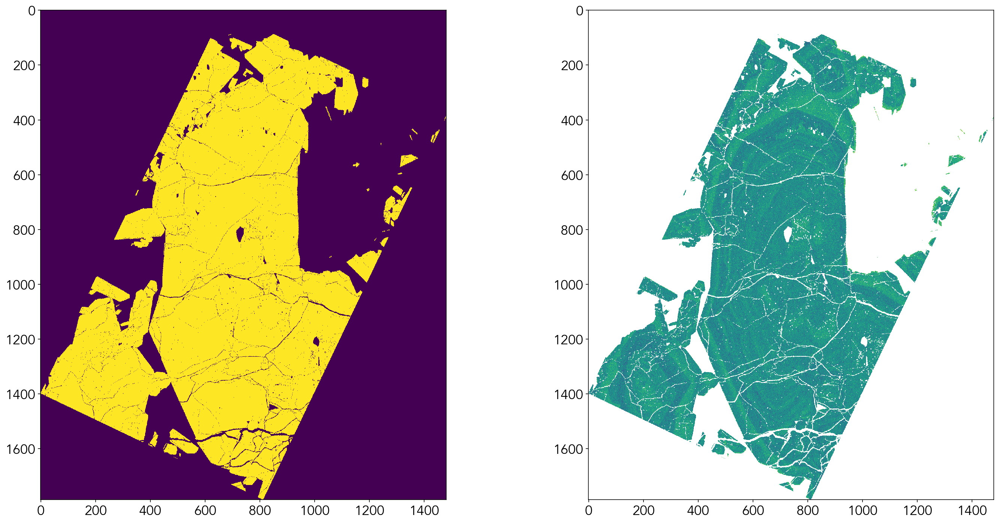

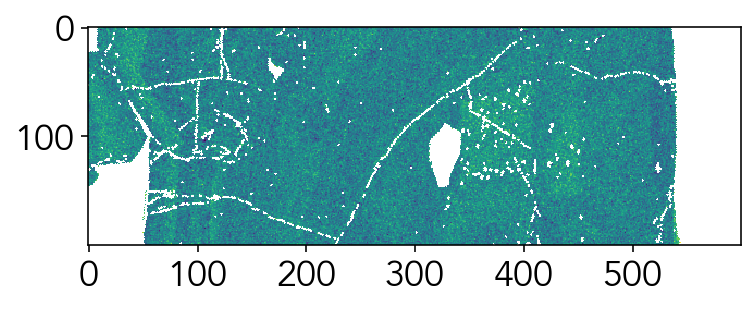

<ipython-input-19-9823f91ffba4>:32: RuntimeWarning: Mean of empty slice
  an_lim1 = np.nanmean(lim1, axis = 0)


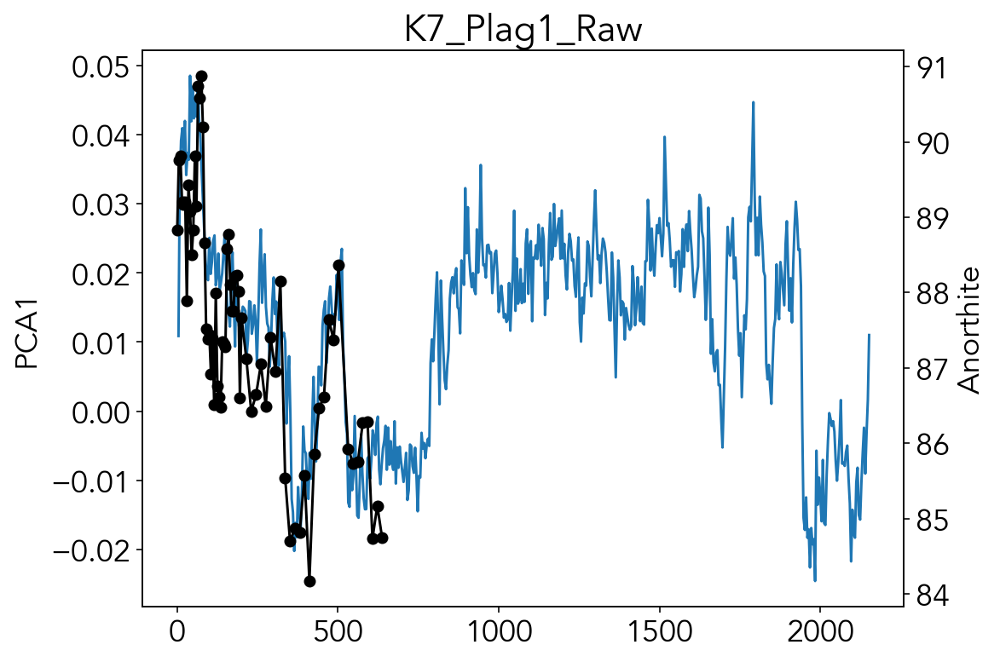

In [19]:
k7_plag1 = DF_NEW.loc['K7_plag1_rtoc']

distance1 = distance_transform_edt(xl1.copy())
local_max1 = peak_local_max(distance_transform_edt(xl1.copy()), indices=False, footprint=np.ones((350, 350)), labels=xl1.copy())
markers1 = morphology.label(local_max1, connectivity = 2)

labels_ws1 = segmentation.watershed(-distance1, markers1, mask=xl1.copy())
labels_ws_plotting1 = labels_ws1.astype('float')
labels_ws_plotting1[~xl1] = np.nan

labels_ws_plotting1[labels_ws_plotting1 == 2] = np.nan
new_mask1 = ~np.isnan(labels_ws_plotting1)
xl_pca1[~new_mask1] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting1, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask1, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca1, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img1, rot_pca1 = qp.rotate(new_mask1, xl1, xl_pca1, 1.125)

lim1 = rot_pca1[700:900, 400:1000]
plt.figure(figsize = (8, 2))
plt.imshow(lim1, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim1 = np.nanmean(lim1, axis = 0)
an_lim1 = an_lim1[~np.isnan(an_lim1)]
x_lim1 = np.linspace(len(an_lim1), 1, len(an_lim1)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
ax.plot(x_lim1[:-7]-x_lim1[-7], -an_lim1[:-7])
axtwin = ax.twinx()
axtwin.plot(k7_plag1['Distance (µ)'], k7_plag1['Anorthite'], '-ko')
plt.title('K7_Plag1_Raw')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

<ipython-input-20-9f5ff6b88767>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max2 = peak_local_max(distance_transform_edt(xl2.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl2.copy())


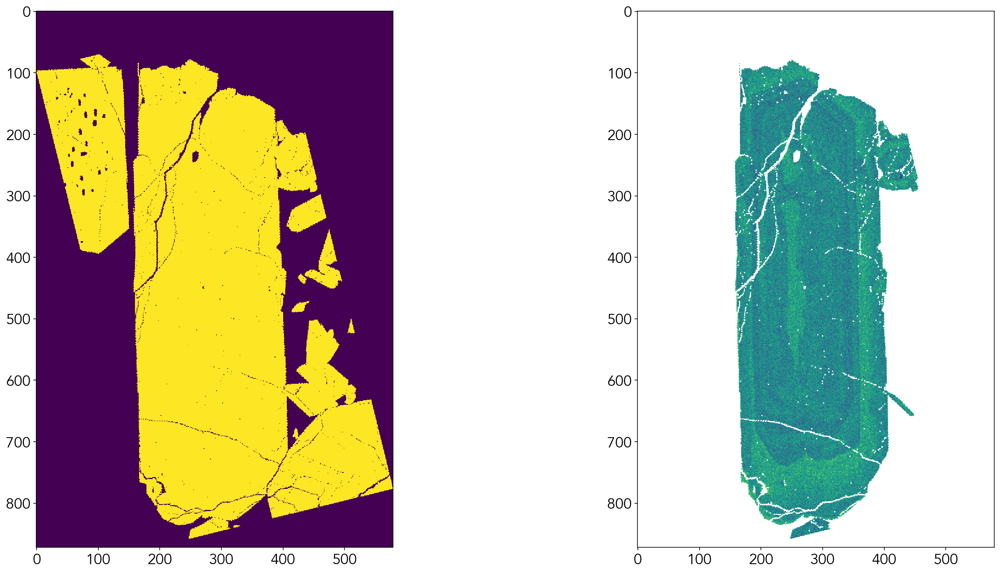

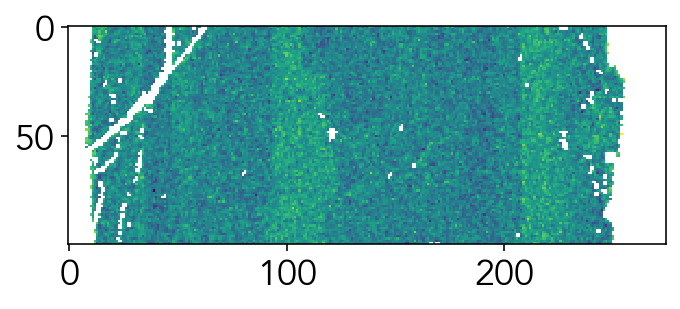

<ipython-input-20-9f5ff6b88767>:37: RuntimeWarning: Mean of empty slice
  an_lim2 = np.nanmean(lim2, axis = 0)


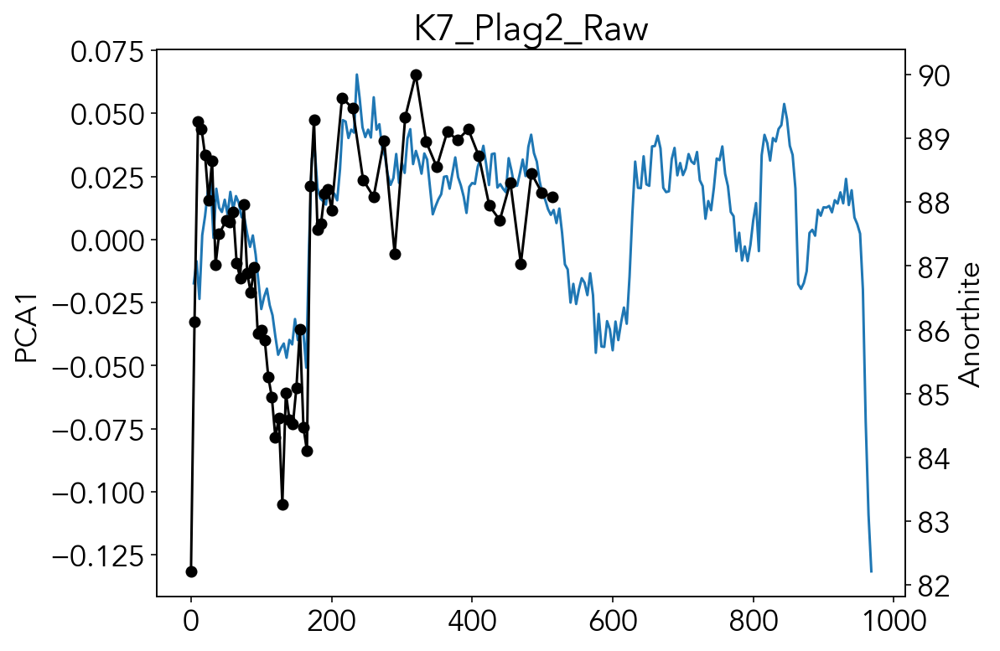

In [20]:
k7_plag2 = DF_NEW.loc['K7_plag2_rtoc']

distance2 = distance_transform_edt(xl2.copy())
local_max2 = peak_local_max(distance_transform_edt(xl2.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl2.copy())
markers2 = morphology.label(local_max2, connectivity = 2)

labels_ws2 = segmentation.watershed(-distance2, markers2, mask=xl2.copy())
labels_ws_plotting2 = labels_ws2.astype('float')
labels_ws_plotting2[~xl2] = np.nan

labels_ws_plotting2[labels_ws_plotting2 == 0] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 1] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 2] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 9] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 10] = np.nan

new_mask2 = ~np.isnan(labels_ws_plotting2)
xl_pca2[~new_mask2] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting2, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask2, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca2, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img2, rot_pca2 = qp.rotate(new_mask2, xl2, xl_pca2, -1.33)

lim2 = rot_pca2[400:500, 150:425]
plt.figure(figsize = (8, 2))
plt.imshow(lim2, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim2 = np.nanmean(lim2, axis = 0)
an_lim2 = an_lim2[~np.isnan(an_lim2)]
x_lim2 = np.linspace(len(an_lim2), 1, len(an_lim2)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
loc = -6
ax.plot(x_lim2[:loc]-x_lim2[loc], -an_lim2[:loc])
axtwin = ax.twinx()
axtwin.plot(k7_plag2['Distance (µ)'], k7_plag2['Anorthite'], '-ko')
plt.title('K7_Plag2_Raw')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

<ipython-input-21-8d80ab719783>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max3 = peak_local_max(distance_transform_edt(xl3.copy()), indices=False, footprint=np.ones((300, 300)), labels=xl3.copy())


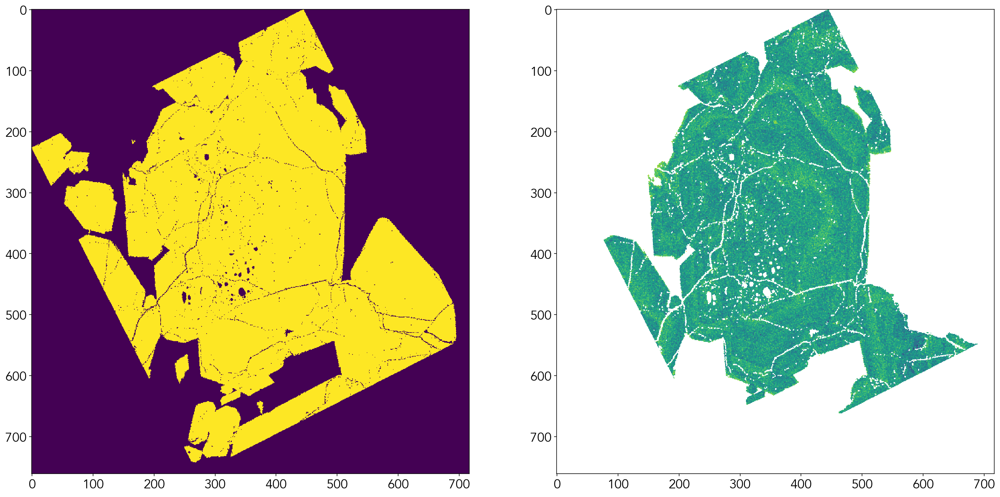

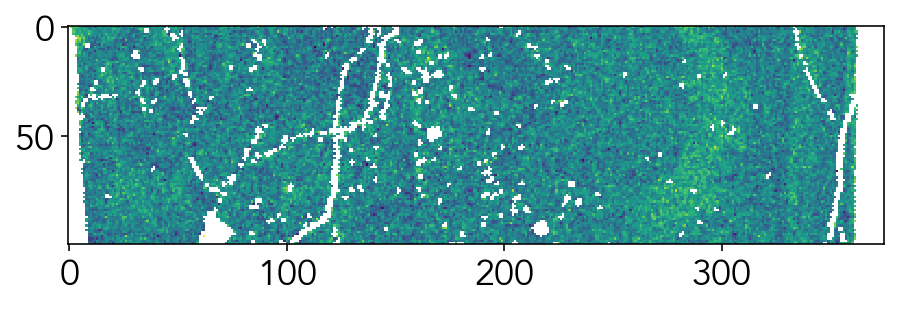

<ipython-input-21-8d80ab719783>:36: RuntimeWarning: Mean of empty slice
  an_lim3 = np.nanmean(lim3, axis = 0)


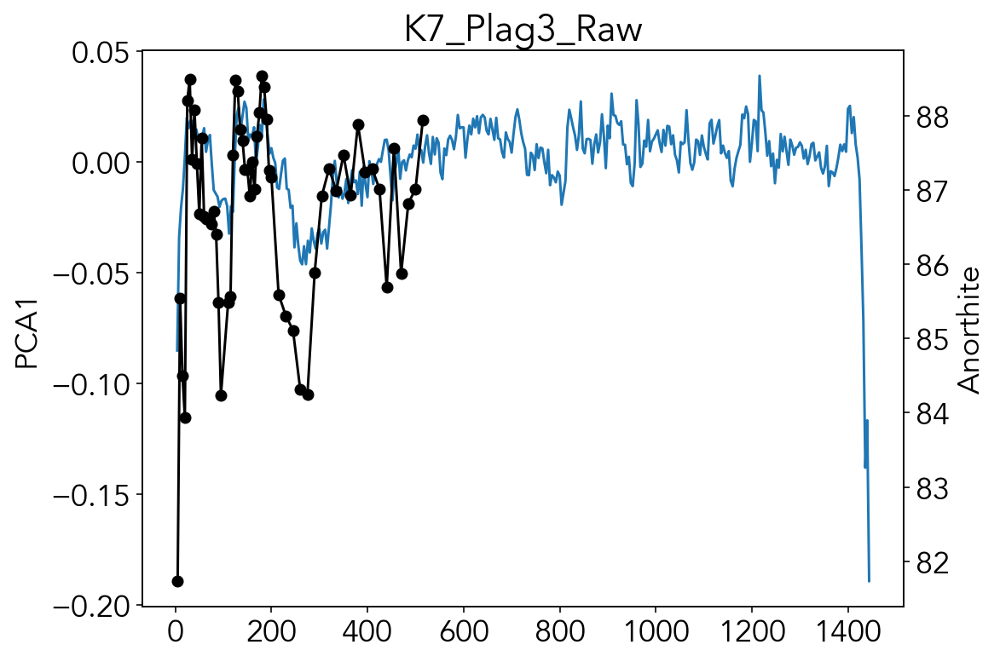

In [21]:
k7_plag3 = DF_NEW.loc['K7_plag3_rtoc']

distance3 = distance_transform_edt(xl3.copy())
local_max3 = peak_local_max(distance_transform_edt(xl3.copy()), indices=False, footprint=np.ones((300, 300)), labels=xl3.copy())
markers3 = morphology.label(local_max3, connectivity = 2)

labels_ws3 = segmentation.watershed(-distance3, markers3, mask=xl3.copy())
labels_ws_plotting3 = labels_ws3.astype('float')
labels_ws_plotting3[~xl3] = np.nan

labels_ws_plotting3[labels_ws_plotting3 == 0] = np.nan
labels_ws_plotting3[labels_ws_plotting3 == 2] = np.nan
labels_ws_plotting3[labels_ws_plotting3 == 5] = np.nan
labels_ws_plotting3[labels_ws_plotting3 == 6] = np.nan

new_mask3 = ~np.isnan(labels_ws_plotting3)
xl_pca3[~new_mask3] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting3, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask3, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca3, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img3, rot_pca3 = qp.rotate(new_mask3, xl3, xl_pca3, -1.1)

lim3 = rot_pca3[300:400, 150:525]
plt.figure(figsize = (8, 2))
plt.imshow(lim3, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim3 = np.nanmean(lim3, axis = 0)
an_lim3 = an_lim3[~np.isnan(an_lim3)]
x_lim3 = np.linspace(len(an_lim3), 1, len(an_lim3)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
loc = -1
ax.plot(x_lim3[:loc]-x_lim3[loc], -an_lim3[:loc])
axtwin = ax.twinx()
axtwin.plot(k7_plag3['Distance (µ)'], k7_plag3['Anorthite'], '-ko')
plt.title('K7_Plag3_Raw')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

<ipython-input-22-3d313e9517f4>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max4 = peak_local_max(distance_transform_edt(xl4.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl4.copy())


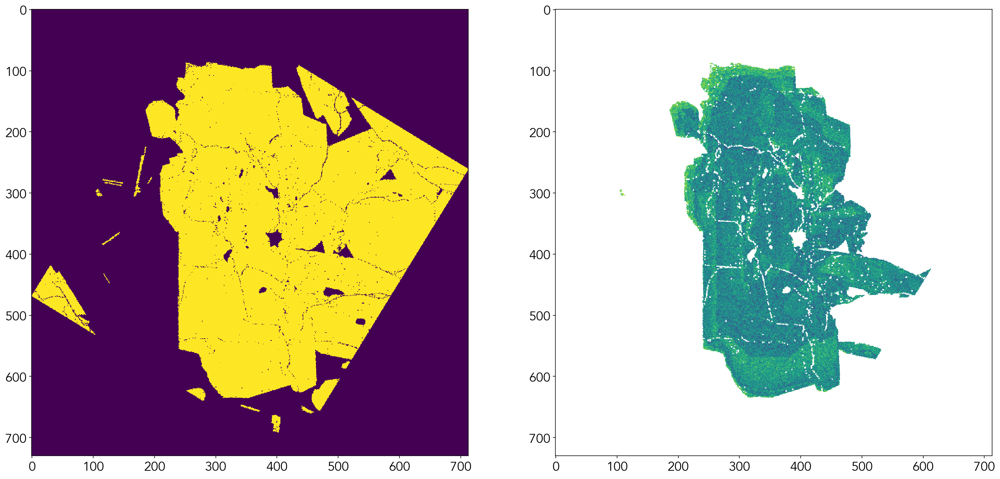

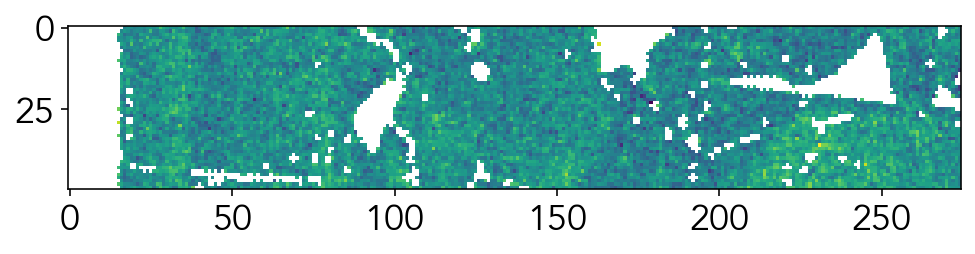

<ipython-input-22-3d313e9517f4>:37: RuntimeWarning: Mean of empty slice
  an_lim4 = np.nanmean(lim4, axis = 0)


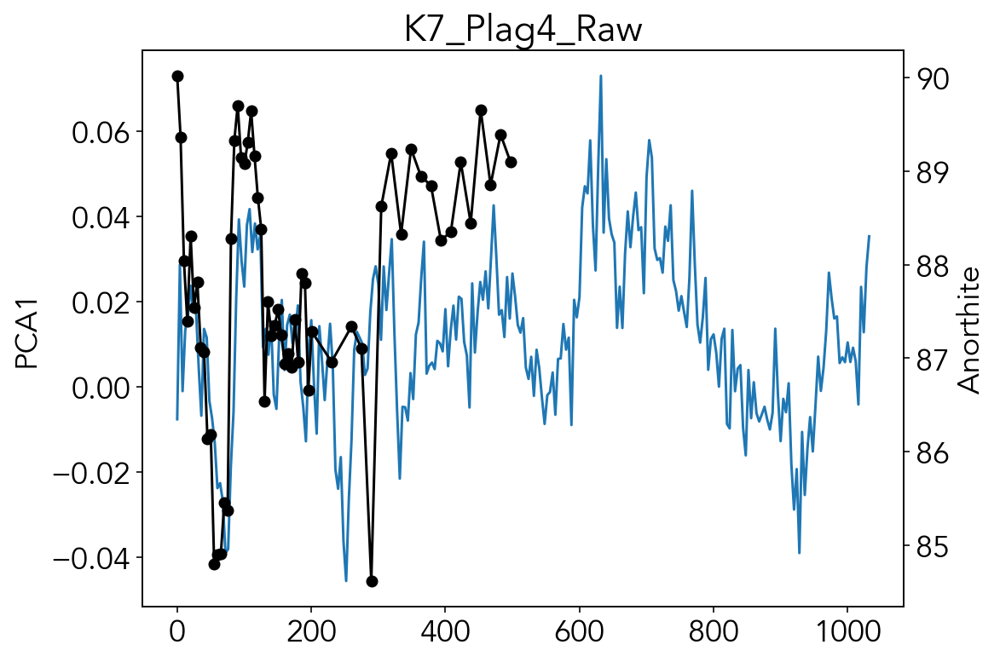

In [22]:
k7_plag4 = DF_NEW.loc['K7_plag4_rtoc']

distance4 = distance_transform_edt(xl4.copy())
local_max4 = peak_local_max(distance_transform_edt(xl4.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl4.copy())
markers4 = morphology.label(local_max4, connectivity = 2)

labels_ws4 = segmentation.watershed(-distance4, markers4, mask=xl4.copy())
labels_ws_plotting4 = labels_ws4.astype('float')
labels_ws_plotting4[~xl4] = np.nan

labels_ws_plotting4[labels_ws_plotting4 == 0] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 1] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 4] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 5] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 10] = np.nan

new_mask4 = ~np.isnan(labels_ws_plotting4)
xl_pca4[~new_mask4] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting4, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask4, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca4, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img4, rot_pca4 = qp.rotate(new_mask4, xl4, xl_pca4, -0.55)

lim4 = rot_pca4[375:425, 225:500]
plt.figure(figsize = (8, 2))
plt.imshow(lim4, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim4 = np.nanmean(lim4, axis = 0)
an_lim4 = an_lim4[~np.isnan(an_lim4)]
x_lim4 = np.linspace(1, len(an_lim4), len(an_lim4)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
loc = 1
ax.plot(x_lim4[loc:]-x_lim4[1], -an_lim4[loc:])
axtwin = ax.twinx()
axtwin.plot(k7_plag4['Distance (µ)'], k7_plag4['Anorthite'], '-ko')
plt.title('K7_Plag4_Raw')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

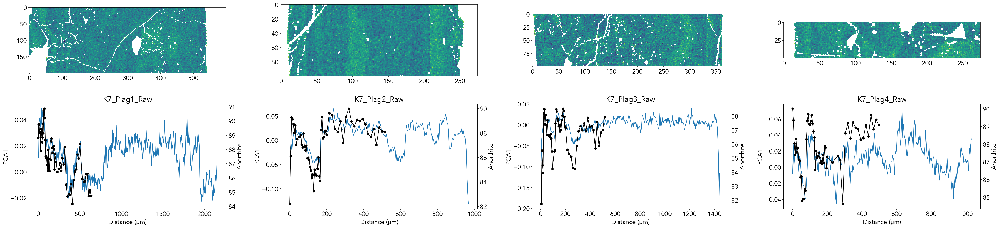

In [23]:
fig, ax = plt.subplots(2, 4, figsize = (40, 10))
ax = ax.flatten()

ax[0].imshow(lim1, interpolation = 'None')
ax[1].imshow(lim2, interpolation = 'None')
ax[2].imshow(lim3, interpolation = 'None')
ax[3].imshow(lim4, interpolation = 'None')

ax[4].plot(x_lim1[:-7]-x_lim1[-7], -an_lim1[:-7])
axtwin = ax[4].twinx()
axtwin.plot(k7_plag1['Distance (µ)'], k7_plag1['Anorthite'], '-ko')
ax[4].set_title('K7_Plag1_Raw')
ax[4].set_xlabel('Distance (µm)')
ax[4].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

loc = -6
ax[5].plot(x_lim2[:loc]-x_lim2[loc], -an_lim2[:loc])
axtwin = ax[5].twinx()
axtwin.plot(k7_plag2['Distance (µ)'], k7_plag2['Anorthite'], '-ko')
ax[5].set_title('K7_Plag2_Raw')
ax[5].set_xlabel('Distance (µm)')
ax[5].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

loc = -1
ax[6].plot(x_lim3[:loc]-x_lim3[loc], -an_lim3[:loc])
axtwin = ax[6].twinx()
axtwin.plot(k7_plag3['Distance (µ)'], k7_plag3['Anorthite'], '-ko')
ax[6].set_title('K7_Plag3_Raw')
ax[6].set_xlabel('Distance (µm)')
ax[6].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

loc = 1
ax[7].plot(x_lim4[loc:]-x_lim4[1], -an_lim4[loc:])
axtwin = ax[7].twinx()
axtwin.plot(k7_plag4['Distance (µ)'], k7_plag4['Anorthite'], '-ko')
ax[7].set_title('K7_Plag4_Raw')
ax[7].set_xlabel('Distance (µm)')
ax[7].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

plt.tight_layout()
plt.show()

In [24]:
xl1, xl_pca1, new_img1 = qp.segment_xl(plag, gauss_plag_pca, 2000, 3550, 950, 1850)
# plt.imshow(xl_pca1, interpolation = 'None', cmap = 'Blues')

xl2, xl_pca2, new_img2 = qp.segment_xl(plag, gauss_plag_pca, 700, 1500, 1700, 2100)
# plt.imshow(xl_pca2, interpolation = 'None', cmap = 'Blues')

xl3, xl_pca3, new_img3 = qp.segment_xl(plag, gauss_plag_pca, 700, 1300, 2300, 2800)
# plt.imshow(xl_pca3, interpolation = 'None', cmap = 'Blues')

xl4, xl_pca4, new_img4 = qp.segment_xl(plag, gauss_plag_pca, 2900, 3400, 2325, 2875)
# plt.imshow(xl_pca4, interpolation = 'None', cmap = 'Blues')

/Users/sarahcshi/QEMSCAN_PyTorch/Code/031822Run_NoNa/QEMSCAN_plotting.py:437: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max = peak_local_max(distance, indices=False, footprint=np.ones((100, 100)), labels=watershed_mask)


<ipython-input-25-626eed8813e8>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max1 = peak_local_max(distance_transform_edt(xl1.copy()), indices=False, footprint=np.ones((350, 350)), labels=xl1.copy())


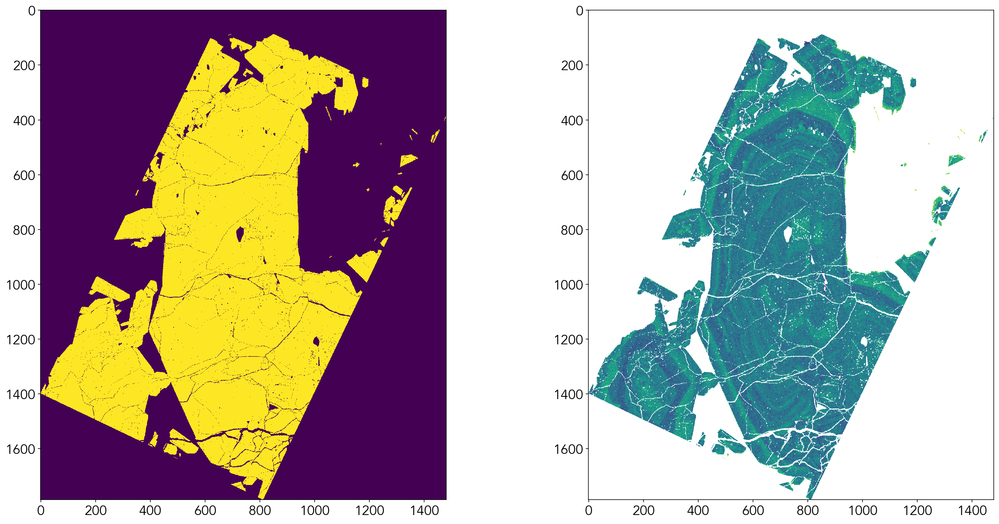

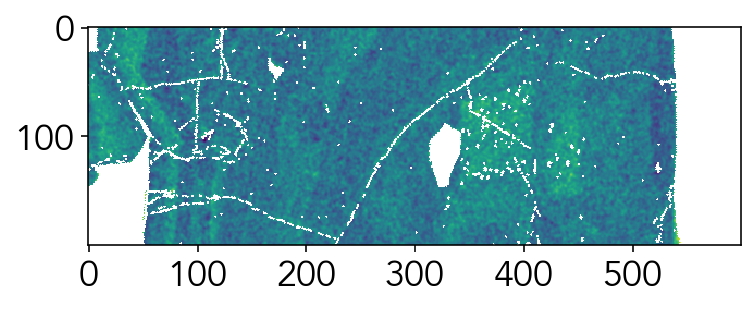

<ipython-input-25-626eed8813e8>:32: RuntimeWarning: Mean of empty slice
  an_lim1 = np.nanmean(lim1, axis = 0)


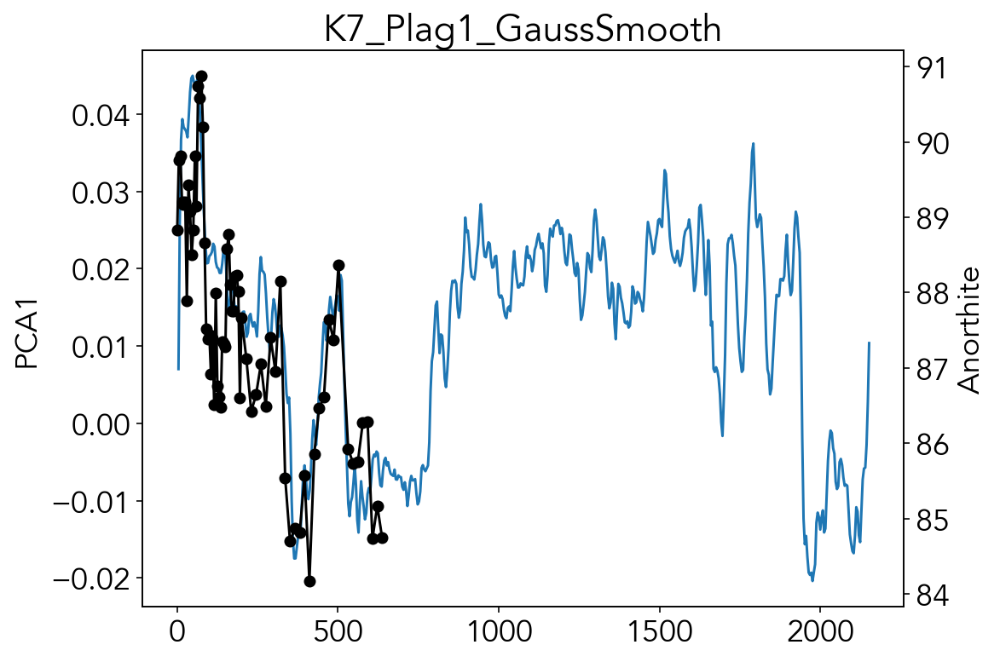

In [25]:
k7_plag1 = DF_NEW.loc['K7_plag1_rtoc']

distance1 = distance_transform_edt(xl1.copy())
local_max1 = peak_local_max(distance_transform_edt(xl1.copy()), indices=False, footprint=np.ones((350, 350)), labels=xl1.copy())
markers1 = morphology.label(local_max1, connectivity = 2)

labels_ws1 = segmentation.watershed(-distance1, markers1, mask=xl1.copy())
labels_ws_plotting1 = labels_ws1.astype('float')
labels_ws_plotting1[~xl1] = np.nan

labels_ws_plotting1[labels_ws_plotting1 == 2] = np.nan
new_mask1 = ~np.isnan(labels_ws_plotting1)
xl_pca1[~new_mask1] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting1, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask1, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca1, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img1, rot_pca1 = qp.rotate(new_mask1, xl1, xl_pca1, 1.125)

lim1 = rot_pca1[700:900, 400:1000]
plt.figure(figsize = (8, 2))
plt.imshow(lim1, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim1 = np.nanmean(lim1, axis = 0)
an_lim1 = an_lim1[~np.isnan(an_lim1)]
x_lim1 = np.linspace(len(an_lim1), 1, len(an_lim1)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
ax.plot(x_lim1[:-7]-x_lim1[-7], -an_lim1[:-7])
axtwin = ax.twinx()
axtwin.plot(k7_plag1['Distance (µ)'], k7_plag1['Anorthite'], '-ko')
plt.title('K7_Plag1_GaussSmooth')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

<ipython-input-26-d32b6968dce0>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max2 = peak_local_max(distance_transform_edt(xl2.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl2.copy())


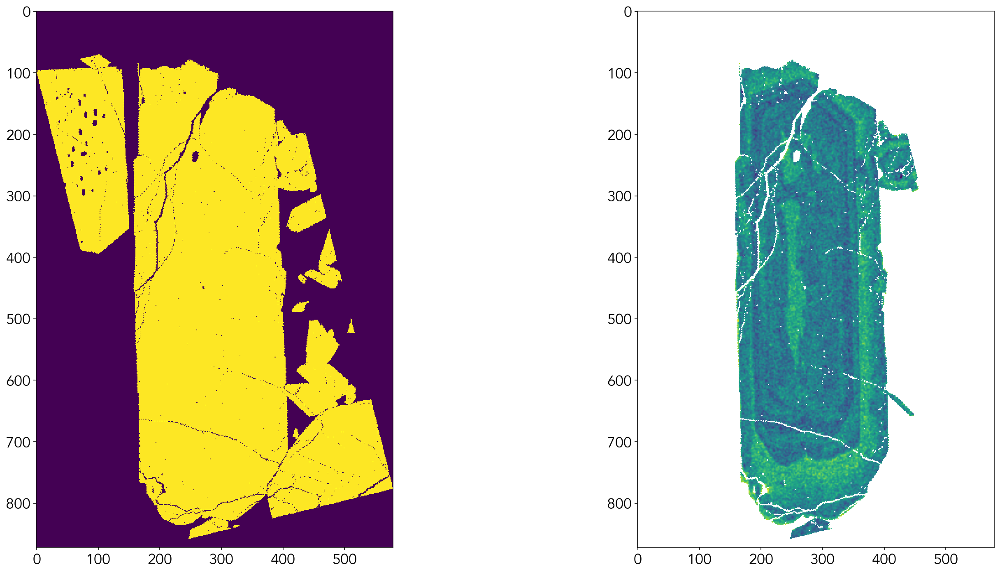

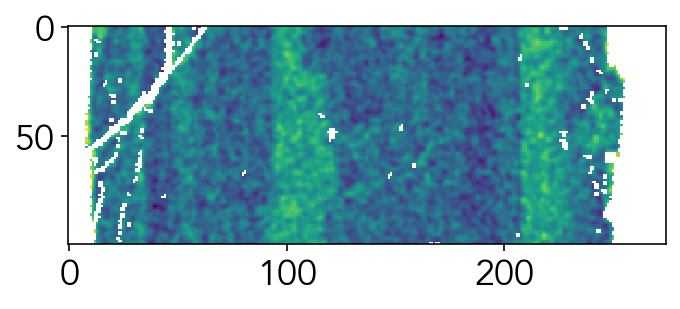

<ipython-input-26-d32b6968dce0>:37: RuntimeWarning: Mean of empty slice
  an_lim2 = np.nanmean(lim2, axis = 0)


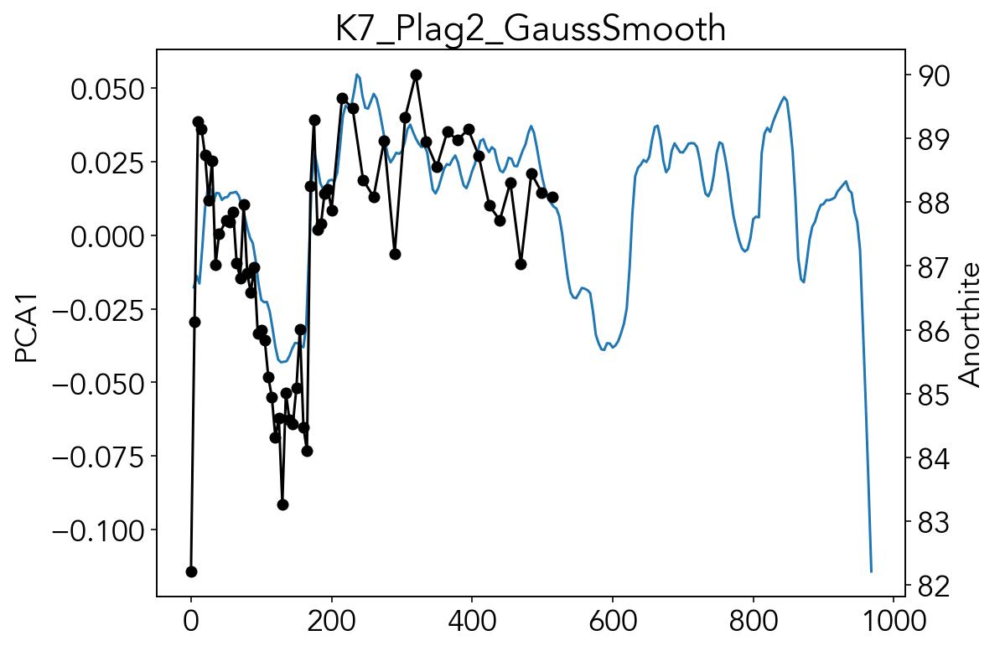

In [26]:
k7_plag2 = DF_NEW.loc['K7_plag2_rtoc']

distance2 = distance_transform_edt(xl2.copy())
local_max2 = peak_local_max(distance_transform_edt(xl2.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl2.copy())
markers2 = morphology.label(local_max2, connectivity = 2)

labels_ws2 = segmentation.watershed(-distance2, markers2, mask=xl2.copy())
labels_ws_plotting2 = labels_ws2.astype('float')
labels_ws_plotting2[~xl2] = np.nan

labels_ws_plotting2[labels_ws_plotting2 == 0] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 1] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 2] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 9] = np.nan
labels_ws_plotting2[labels_ws_plotting2 == 10] = np.nan

new_mask2 = ~np.isnan(labels_ws_plotting2)
xl_pca2[~new_mask2] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting2, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask2, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca2, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img2, rot_pca2 = qp.rotate(new_mask2, xl2, xl_pca2, -1.33)

lim2 = rot_pca2[400:500, 150:425]
plt.figure(figsize = (8, 2))
plt.imshow(lim2, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim2 = np.nanmean(lim2, axis = 0)
an_lim2 = an_lim2[~np.isnan(an_lim2)]
x_lim2 = np.linspace(len(an_lim2), 1, len(an_lim2)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
loc = -6
ax.plot(x_lim2[:loc]-x_lim2[loc], -an_lim2[:loc])
axtwin = ax.twinx()
axtwin.plot(k7_plag2['Distance (µ)'], k7_plag2['Anorthite'], '-ko')
plt.title('K7_Plag2_GaussSmooth')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

<ipython-input-27-f8a746a6e713>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max3 = peak_local_max(distance_transform_edt(xl3.copy()), indices=False, footprint=np.ones((300, 300)), labels=xl3.copy())


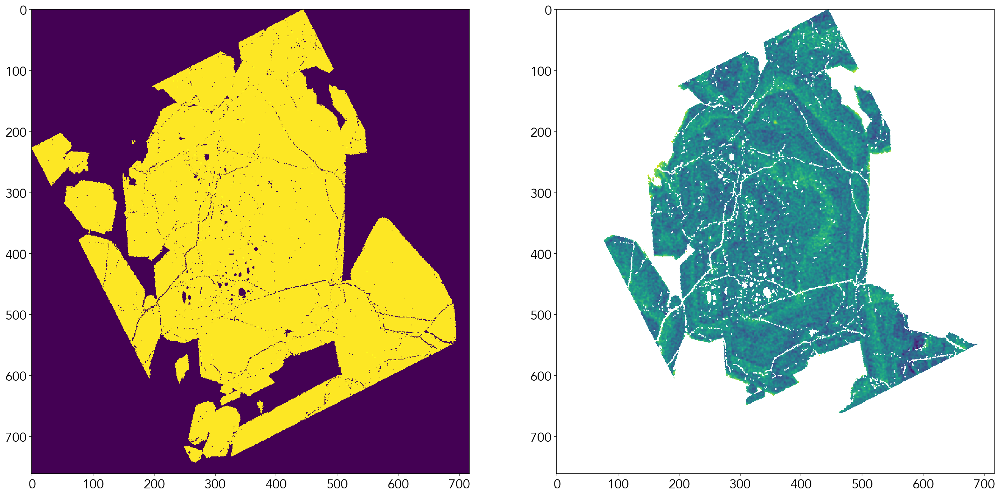

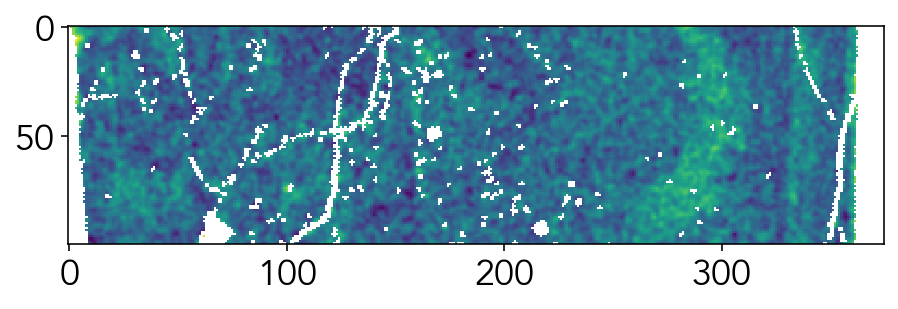

<ipython-input-27-f8a746a6e713>:36: RuntimeWarning: Mean of empty slice
  an_lim3 = np.nanmean(lim3, axis = 0)


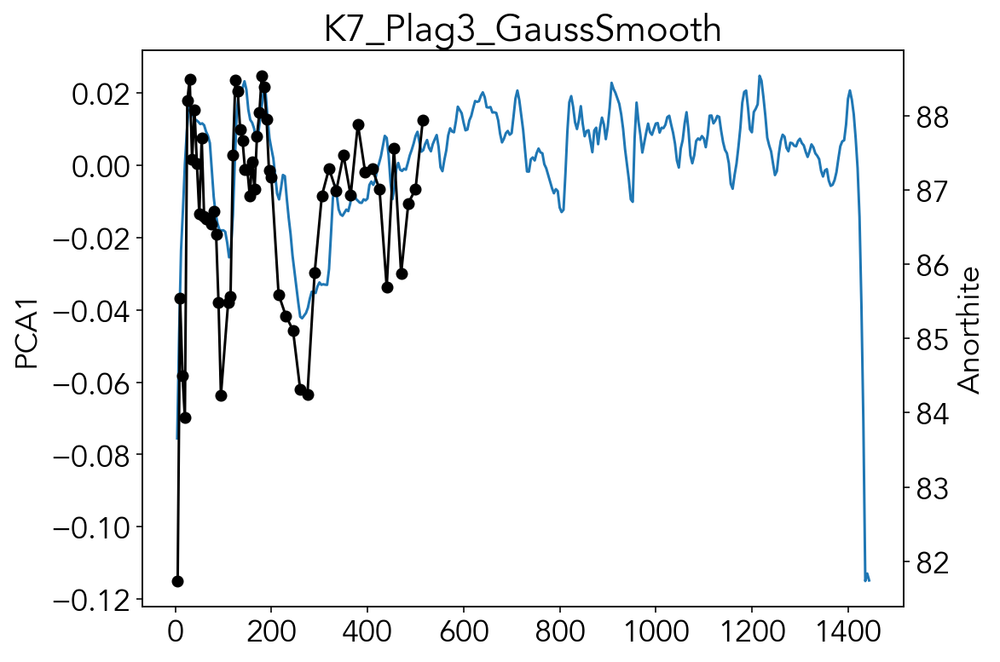

In [27]:
k7_plag3 = DF_NEW.loc['K7_plag3_rtoc']

distance3 = distance_transform_edt(xl3.copy())
local_max3 = peak_local_max(distance_transform_edt(xl3.copy()), indices=False, footprint=np.ones((300, 300)), labels=xl3.copy())
markers3 = morphology.label(local_max3, connectivity = 2)

labels_ws3 = segmentation.watershed(-distance3, markers3, mask=xl3.copy())
labels_ws_plotting3 = labels_ws3.astype('float')
labels_ws_plotting3[~xl3] = np.nan

labels_ws_plotting3[labels_ws_plotting3 == 0] = np.nan
labels_ws_plotting3[labels_ws_plotting3 == 2] = np.nan
labels_ws_plotting3[labels_ws_plotting3 == 5] = np.nan
labels_ws_plotting3[labels_ws_plotting3 == 6] = np.nan

new_mask3 = ~np.isnan(labels_ws_plotting3)
xl_pca3[~new_mask3] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting3, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask3, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca3, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img3, rot_pca3 = qp.rotate(new_mask3, xl3, xl_pca3, -1.1)

lim3 = rot_pca3[300:400, 150:525]
plt.figure(figsize = (8, 2))
plt.imshow(lim3, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim3 = np.nanmean(lim3, axis = 0)
an_lim3 = an_lim3[~np.isnan(an_lim3)]
x_lim3 = np.linspace(len(an_lim3), 1, len(an_lim3)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
loc = -1
ax.plot(x_lim3[:loc]-x_lim3[loc], -an_lim3[:loc])
axtwin = ax.twinx()
axtwin.plot(k7_plag3['Distance (µ)'], k7_plag3['Anorthite'], '-ko')
plt.title('K7_Plag3_GaussSmooth')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

<ipython-input-28-94aace6ae832>:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_max4 = peak_local_max(distance_transform_edt(xl4.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl4.copy())


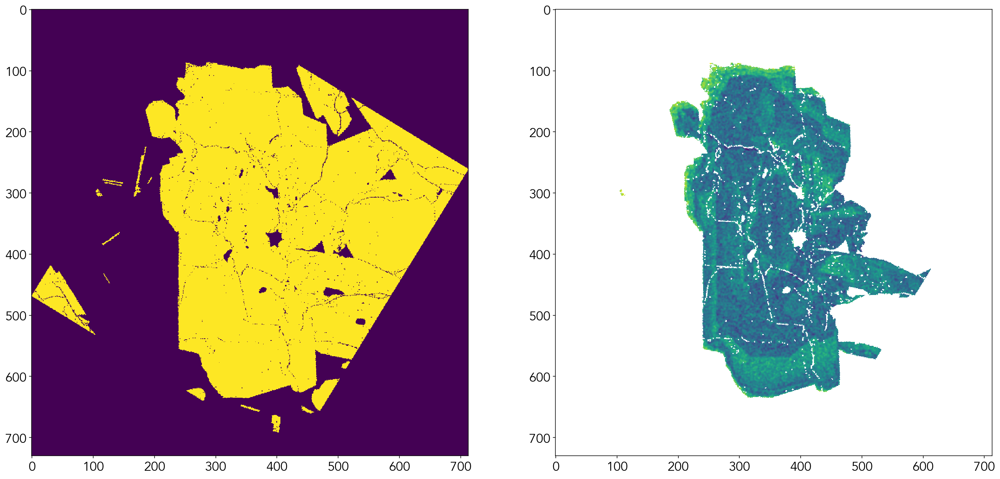

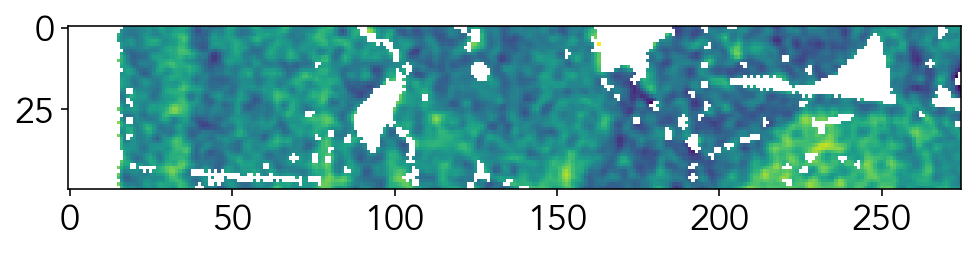

<ipython-input-28-94aace6ae832>:37: RuntimeWarning: Mean of empty slice
  an_lim4 = np.nanmean(lim4, axis = 0)


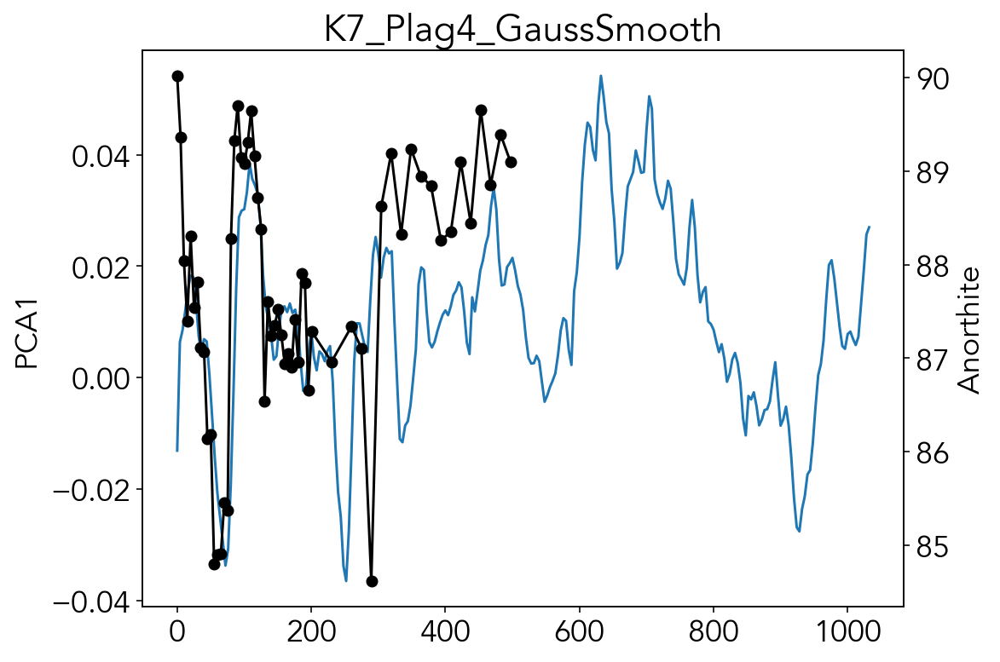

In [28]:
k7_plag4 = DF_NEW.loc['K7_plag4_rtoc']

distance4 = distance_transform_edt(xl4.copy())
local_max4 = peak_local_max(distance_transform_edt(xl4.copy()), indices=False, footprint=np.ones((150, 150)), labels=xl4.copy())
markers4 = morphology.label(local_max4, connectivity = 2)

labels_ws4 = segmentation.watershed(-distance4, markers4, mask=xl4.copy())
labels_ws_plotting4 = labels_ws4.astype('float')
labels_ws_plotting4[~xl4] = np.nan

labels_ws_plotting4[labels_ws_plotting4 == 0] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 1] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 4] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 5] = np.nan
labels_ws_plotting4[labels_ws_plotting4 == 10] = np.nan

new_mask4 = ~np.isnan(labels_ws_plotting4)
xl_pca4[~new_mask4] = np.nan

# fig, ax = plt.subplots(1, 3, figsize = (24, 8))
# ax = ax.flatten()
# im1 = ax[0].imshow(labels_ws_plotting4, cmap = 'turbo')
# cbar1 = fig.colorbar(im1, ax = ax[0])
# im2 = ax[1].imshow(new_mask4, interpolation = 'None')
# cbar2 = fig.colorbar(im2, ax = ax[1])
# im3 = ax[2].imshow(-xl_pca4, interpolation = 'None', cmap = 'Blues', vmin=-plag_pca_mean-2*plag_pca_std, vmax=-plag_pca_mean+2*plag_pca_std)
# cbar3 = fig.colorbar(im3, ax = ax[2])

rot_img4, rot_pca4 = qp.rotate(new_mask4, xl4, xl_pca4, -0.55)

lim4 = rot_pca4[375:425, 225:500]
plt.figure(figsize = (8, 2))
plt.imshow(lim4, interpolation = 'None')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

an_lim4 = np.nanmean(lim4, axis = 0)
an_lim4 = an_lim4[~np.isnan(an_lim4)]
x_lim4 = np.linspace(1, len(an_lim4), len(an_lim4)) * 4

fig, ax = plt.subplots(1, 1, figsize = (8, 6))
loc = 1
ax.plot(x_lim4[loc:]-x_lim4[1], -an_lim4[loc:])
axtwin = ax.twinx()
axtwin.plot(k7_plag4['Distance (µ)'], k7_plag4['Anorthite'], '-ko')
plt.title('K7_Plag4_GaussSmooth')
plt.xlabel('Distance (µm)')
ax.set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')
plt.show()

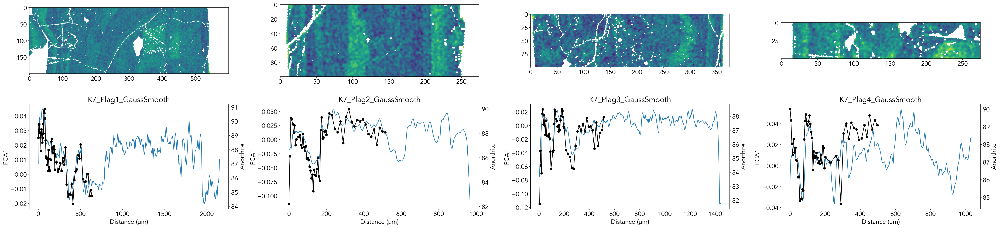

In [29]:
fig, ax = plt.subplots(2, 4, figsize = (40, 10))
ax = ax.flatten()

ax[0].imshow(lim1, interpolation = 'None')
ax[1].imshow(lim2, interpolation = 'None')
ax[2].imshow(lim3, interpolation = 'None')
ax[3].imshow(lim4, interpolation = 'None')

ax[4].plot(x_lim1[:-7]-x_lim1[-7], -an_lim1[:-7])
axtwin = ax[4].twinx()
axtwin.plot(k7_plag1['Distance (µ)'], k7_plag1['Anorthite'], '-ko')
ax[4].set_title('K7_Plag1_GaussSmooth')
ax[4].set_xlabel('Distance (µm)')
ax[4].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

loc = -6
ax[5].plot(x_lim2[:loc]-x_lim2[loc], -an_lim2[:loc])
axtwin = ax[5].twinx()
axtwin.plot(k7_plag2['Distance (µ)'], k7_plag2['Anorthite'], '-ko')
ax[5].set_title('K7_Plag2_GaussSmooth')
ax[5].set_xlabel('Distance (µm)')
ax[5].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

loc = -1
ax[6].plot(x_lim3[:loc]-x_lim3[loc], -an_lim3[:loc])
axtwin = ax[6].twinx()
axtwin.plot(k7_plag3['Distance (µ)'], k7_plag3['Anorthite'], '-ko')
ax[6].set_title('K7_Plag3_GaussSmooth')
ax[6].set_xlabel('Distance (µm)')
ax[6].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

loc = 1
ax[7].plot(x_lim4[loc:]-x_lim4[1], -an_lim4[loc:])
axtwin = ax[7].twinx()
axtwin.plot(k7_plag4['Distance (µ)'], k7_plag4['Anorthite'], '-ko')
ax[7].set_title('K7_Plag4_GaussSmooth')
ax[7].set_xlabel('Distance (µm)')
ax[7].set_ylabel('PCA1')
axtwin.set_ylabel('Anorthite')

plt.tight_layout()
plt.show()